In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import scanpy as sc
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px
import numpy as np
import pandas as pd 
import os, json, pickle


In [3]:
import sys 
sys.path.append('../src')

from spaceoracle.oracles import SpaceOracle
from spaceoracle.tools.network import MouseKidneyRegulatoryNetwork

%config InlineBackend.figure_format = 'retina'

# co_grn = MouseKidneyRegulatoryNetwork()
# adata = sc.read_h5ad('.cache/kidney_chip275_dim35.h5ad')
# spatial_dim=35

co_grn = None
adata = sc.read_h5ad('.cache/adata_train.h5ad')
spatial_dim = 1

2024-10-24 11:34:03.511656: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### Load model results

In [4]:
so = SpaceOracle(
    adata=adata,
    annot='rctd_cluster', 
    max_epochs=5, 
    learning_rate=7e-4, 
    spatial_dim=spatial_dim,
    batch_size=256,
    rotate_maps=True,
    alpha=0.4,
    grn=co_grn
)

In [5]:
def load_perturbed(so, ko_path):
    gem_simulated = pd.read_csv(ko_path, index_col = 0)
    gem_simulated = gem_simulated.reindex(
        columns=gem_simulated.columns.union(so.adata.var_names), 
        fill_value=0
    )

    gene_mtx = so.adata.layers['imputed_count']

    # clear downstream analyses
    for key in ['transition_probabilities', 'grid_points', 'vector_field']:
        so.adata.uns.pop(key, None)
    
    so.adata.layers['simulated_count'] = gem_simulated
    so.adata.layers['delta_X'] = gem_simulated - gene_mtx
    

goi = 'Il2'
ko_path = f'/ix/djishnu/shared/djishnu_kor11/ko_{goi}_lymph.csv'
load_perturbed(so, ko_path)


In [6]:
adata

AnnData object with n_obs × n_vars = 11567 × 5013
    obs: 'cluster', 'rctd_cluster', 'rctd_celltypes'
    uns: 'log1p'
    obsm: 'X_spatial', 'rctd_results', 'spatial'
    layers: 'imputed_count', 'normalized_count', 'raw_count'

### Initialize model

In [7]:
from spaceoracle.plotting.layout import *

# view_spatial2D(adata, annot='rctd_celltypes')
view_spatial3D(adata, annot='rctd_celltypes', show=True, flat=False)

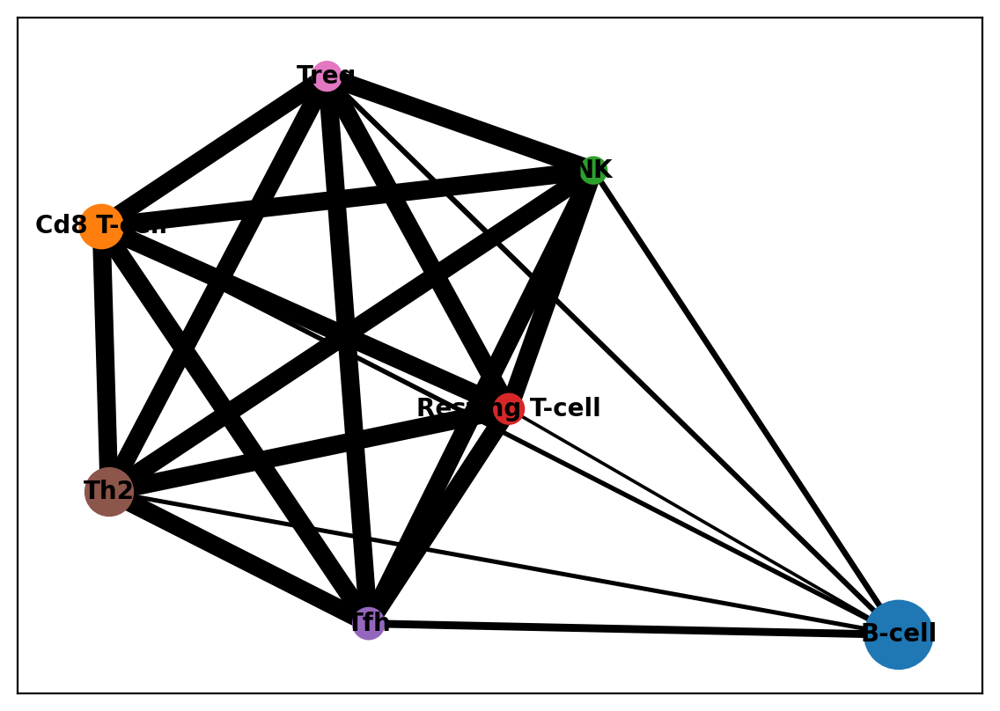

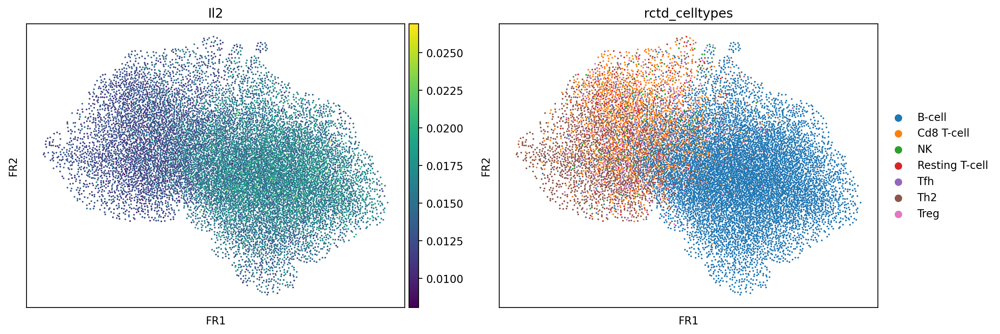

In [8]:
from spaceoracle.plotting.transitions import *

compare_gex(so.adata, annot='rctd_celltypes', goi=goi)

array([[<AxesSubplot: title={'center': 'Il2'}>]], dtype=object)

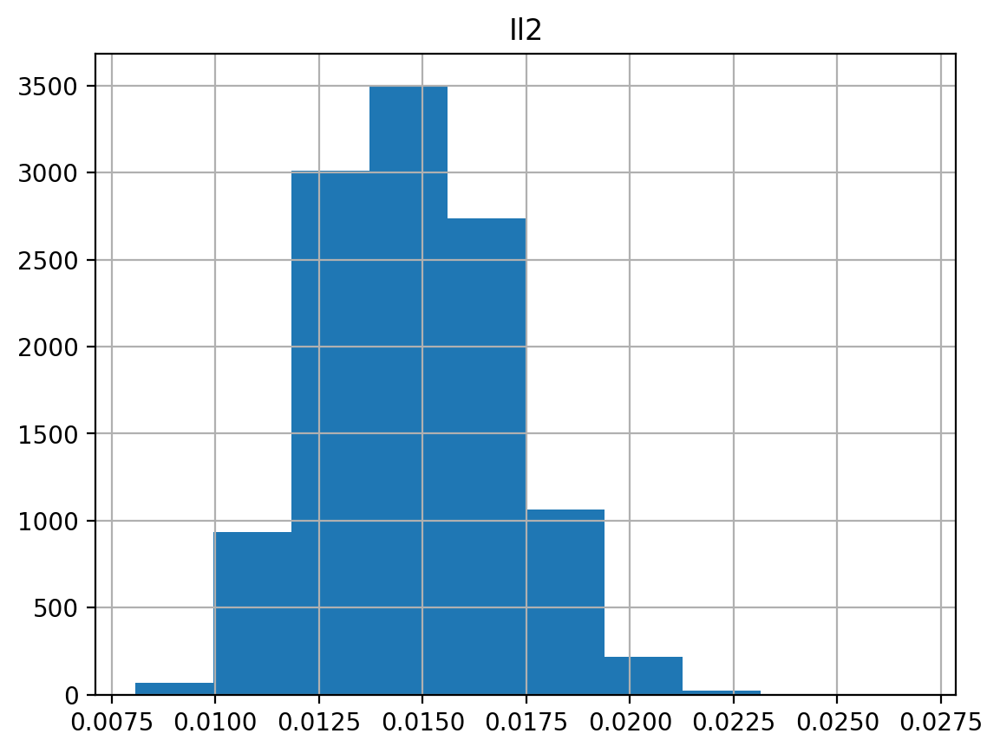

In [9]:
sc.get.obs_df(so.adata, keys=[goi], layer="imputed_count").hist()

In [10]:
so.pcs = so.perform_PCA(so.adata)
so.knn_imputation(so.adata, so.pcs)

In [ ]:
estimate_transitions_2D(
    so.adata, so.adata.layers['delta_X'], so.adata.obsm['X_draw_graph_fr'], 
    annot='rctd_cluster', grid_scale=3, vector_scale=1, n_jobs=10)

# estimate_transitions_2D(
#     so.adata, so.adata.layers['delta_X'], so.adata.obsm['X_draw_graph_fr'], 
#     annot='rctd_cluster', normalize=False, grid_scale=2, vector_scale=0.1, n_jobs=1)

In [12]:
P = so.adata.uns['P']

x = so.adata.obsm['X_draw_graph_fr'][:, 0]
y = so.adata.obsm['X_draw_graph_fr'][:, 1]

intensity = np.sum(P, axis=0)
plt.scatter(x, y, c=intensity, cmap='Blues', s=1)
plt.colorbar(label='Intensity')
plt.axis('off')
plt.tight_layout()

KeyError: 'P'

Computing vectors: 100%|██████████| 1935/1935 [00:00<00:00, 15689.17it/s]


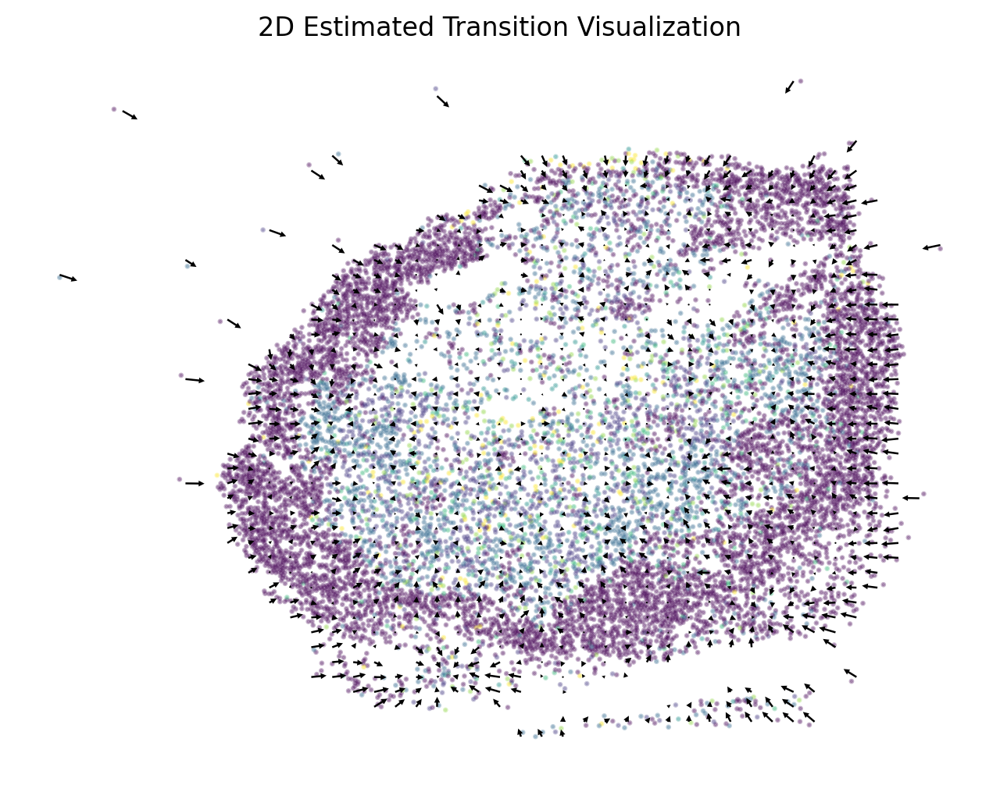

In [28]:
estimate_transitions_2D(
    so.adata, so.adata.layers['delta_X'], so.adata.obsm['X_spatial'], 
    annot='rctd_cluster', normalize=True, grid_scale=0.01, vector_scale=100, n_jobs=1)

# estimate_transitions_2D(
#     so.adata, so.adata.layers['delta_X'], so.adata.obsm['X_spatial'], 
#     annot='rctd_cluster', normalize=False, grid_scale=0.01, vector_scale=0.1, n_jobs=1)

In [ ]:
P = so.adata.uns['P']

x = so.adata.obsm['X_spatial'][:, 0]
y = so.adata.obsm['X_spatial'][:, 1]

intensity = np.sum(P, axis=0)
plt.scatter(x, y, c=intensity, cmap='Blues', s=1, alpha=0.7)
plt.colorbar(label='Intensity')
plt.axis('off')
plt.tight_layout()

In [16]:
celltypes = ['B-cell', 'Cd8 T-cell']

cell_idxs = np.where(adata.obs['rctd_celltypes'].isin(celltypes))[0]
len(cell_idxs)

adata_ct = adata[adata.obs_names[cell_idxs]]
delta_X_ct = so.adata.layers['delta_X'][cell_idxs, :]

# view_spatial3D(adata_ct, annot='rctd_celltypes', flat=True, show=True)
embedding_ct = view_spatial3D(adata_ct, annot='rctd_celltypes', flat=True, show=False)

In [66]:
estimate_transitions_3D(
    adata_ct, delta_X_ct, embedding_ct, annot='rctd_celltypes', 
    normalize=True, grid_scale=0.01, vector_scale=1, n_jobs=1)

# estimate_transitions_3D(
#     adata_ct, delta_X_ct, embedding_ct, annot='rctd_celltypes', 
#     normalize=False, grid_scale=0.01, vector_scale=1, n_jobs=1)

Computing vectors: 100%|██████████| 3600/3600 [00:00<00:00, 46099.56it/s]
